In [2]:
import shutil
import time
from pathlib import Path

import cv2
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import rasterio
import torch
from affine import Affine
from huggingface_hub.errors import GatedRepoError
from matplotlib.patches import Patch
from rasterio.features import rasterize, shapes
from shapely.geometry import shape
from shapely.ops import unary_union
from transformers import AutoModel, AutoProcessor

plt.rcParams.update({"figure.dpi": 90, "axes.titlesize": 11})

SCIEZKA_ZDJECIA = Path("dane/tapias_ortofoto.tif")   # <- tu podstaw własne zdjęcie
KATALOG_WYNIKOW = Path("wyniki/sam3_maski")
KATALOG_WYNIKOW.mkdir(parents=True, exist_ok=True)
# Domyślnie SAM3-LiteText: SAM 3 z lżejszym enkoderem tekstu, bez bramki. Pełny SAM 3 to "facebook/sam3"
# (wagi „gated” — wymaga zgody Meta na Hugging Face); reszta notebooka zostaje bez zmian.
ID_MODELU = "vil-uob/sam3-litetext-s0"

URZADZENIE = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"

# Kadr do prób i powiększeń (wiersze, kolumny) — ten sam co w poziomach 1–3
FRAGMENT = np.s_[850:1250, 1000:1400]

# Klasy — te same co w poziomie 3 (VDD): dzięki temu maski z SAM 3 pasują do modelu z notebooka 03
NAZWY_KLAS = ["inne", "ściana", "droga", "roślinność", "pojazd", "dach", "woda"]
KOLORY_KLAS = ["#8c8c8c", "#e63c3c", "#ffffff", "#28a028", "#0078ff", "#ff9600", "#00dcdc"]
KOLORY_RGB = np.array([[int(k[i:i + 2], 16) for i in (1, 3, 5)] for k in KOLORY_KLAS], dtype=np.uint8)
N_KLAS = len(NAZWY_KLAS)
NIEZNANE = 255    # piksel, o którym SAM 3 nic nie powiedział. To NIE jest klasa „inne” (patrz sekcja 5)

print("Urządzenie:", URZADZENIE, "| torch", torch.__version__)

/Users/marcin/geoai_ml/.venv/lib/python3.14/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Urządzenie: mps | torch 2.14.0


Zdjęcie: 1731 x 1731 px, GSD 0.12 m, układ EPSG:32618
Po skalowaniu do 1008 px:  całe zdjęcie — piksel = 21 cm, kadr 400 px — 4.8 cm


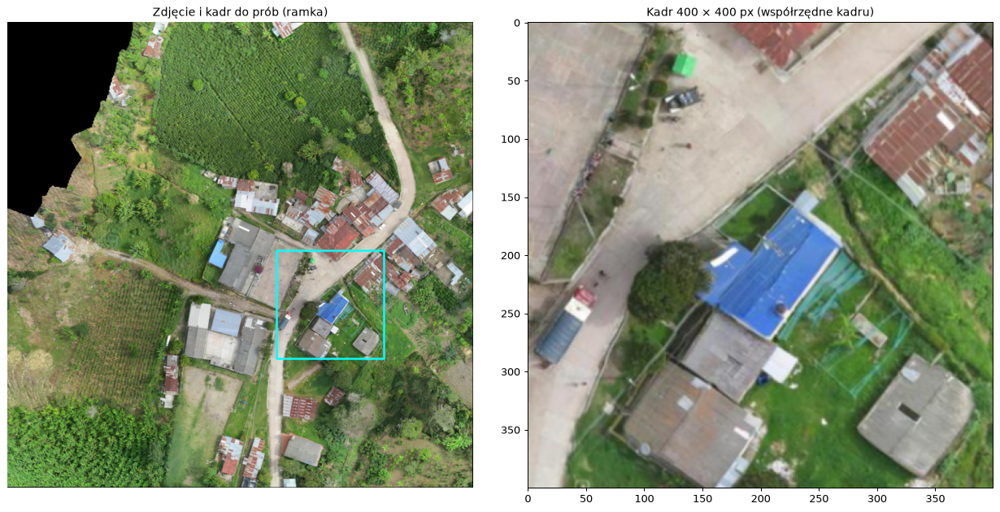

In [3]:
def wczytaj_zdjecie(sciezka, gsd_reczne=None):
    """Zwraca: rgb (H,W,3 uint8), waznie (H,W bool), profil (transform, crs), gsd [m/piksel]."""
    with rasterio.open(sciezka) as src:
        if src.count < 3 or src.dtypes[0] != "uint8":
            raise ValueError(f"Oczekuję 8-bitowego RGB, a jest: {src.count} pasm, {src.dtypes[0]}")
        rgb = np.moveaxis(src.read([1, 2, 3]), 0, -1)
        profil = {"transform": src.transform, "crs": src.crs}
        metryczny = src.crs is not None and src.crs.is_projected
        gsd = src.res[0] if metryczny else gsd_reczne
    waznie = ~(rgb == 0).all(axis=-1)          # czarne tło ortomozaiku = brak danych
    if gsd is None:
        raise ValueError("Zdjęcie nie jest w układzie metrycznym — podaj gsd_reczne (m/piksel).")
    return rgb, waznie, profil, gsd


def nakladka(rgb, maska, kolor=(255, 0, 255), alfa=0.55):
    """Półprzezroczysta maska nałożona na zdjęcie (do oceny wzrokowej)."""
    wynik = rgb.astype(np.float32)
    wynik[maska] = (1 - alfa) * wynik[maska] + alfa * np.array(kolor, dtype=np.float32)
    return wynik.astype(np.uint8)


def koloruj_obiekty(obraz, obiekty, alfa=0.6, seed=1):
    """Każdy obiekt w innym losowym kolorze. Większe maluje pierwsze, mniejsze na wierzchu — bo maski się nakładają."""
    rng = np.random.default_rng(seed)
    wynik = obraz.astype(np.float32)
    for o in sorted(obiekty, key=lambda o: -o["piksele"]):
        wys, szer = o["maska"].shape
        okno = wynik[o["wiersz"]:o["wiersz"] + wys, o["kolumna"]:o["kolumna"] + szer]
        okno[o["maska"]] = (1 - alfa) * okno[o["maska"]] + alfa * rng.integers(40, 255, 3)
    return wynik.astype(np.uint8)


def maska_z_obiektow(obiekty, ksztalt):
    """Suma (OR) masek obiektów jako jedna maska bool o rozmiarze `ksztalt` — nakładające się obiekty liczą się raz."""
    wynik = np.zeros(ksztalt, dtype=bool)
    for o in obiekty:
        wys, szer = o["maska"].shape
        wynik[o["wiersz"]:o["wiersz"] + wys, o["kolumna"]:o["kolumna"] + szer] |= o["maska"]
    return wynik


rgb, waznie, profil, gsd = wczytaj_zdjecie(SCIEZKA_ZDJECIA)
kadr = rgb[FRAGMENT].copy()

print(f"Zdjęcie: {rgb.shape[1]} x {rgb.shape[0]} px, GSD {gsd:.2f} m, układ {profil['crs']}")
print(f"Po skalowaniu do 1008 px:  całe zdjęcie — piksel = {gsd * max(rgb.shape[:2]) / 1008 * 100:.0f} cm, "
      f"kadr {kadr.shape[1]} px — {gsd * max(kadr.shape[:2]) / 1008 * 100:.1f} cm")

fig, ax = plt.subplots(1, 2, figsize=(14, 6.8))
ax[0].imshow(rgb)
ax[0].add_patch(plt.Rectangle((FRAGMENT[1].start, FRAGMENT[0].start), kadr.shape[1], kadr.shape[0], fill=False, ec="cyan", lw=2))
ax[0].set_title("Zdjęcie i kadr do prób (ramka)"); ax[0].axis("off")
ax[1].imshow(kadr); ax[1].set_title("Kadr 400 × 400 px (współrzędne kadru)")
plt.tight_layout()

In [4]:
def wczytaj_sam3(id_modelu=ID_MODELU):
    """Procesor (skalowanie obrazu do 1008 px + tokenizer frazy) i model. Wagi pobierają się przy pierwszym użyciu do cache Hugging Face."""
    try:
        procesor = AutoProcessor.from_pretrained(id_modelu)
        model = AutoModel.from_pretrained(id_modelu)
    except GatedRepoError as blad:
        raise RuntimeError(
            f"Brak dostępu do {id_modelu}. Wagi SAM 3 są „gated”: wejdź na https://huggingface.co/{id_modelu}, zaloguj się, "
            "poproś o dostęp i przyjmij licencję (zatwierdzenie jest ręczne), a potem zaloguj się lokalnie: `hf auth login`."
        ) from blad
    return procesor, model.to(URZADZENIE).eval()

In [5]:
t0 = time.perf_counter()
procesor, model = wczytaj_sam3()
print(f"SAM 3 na urządzeniu: {URZADZENIE}, wczytany w {time.perf_counter() - t0:.0f} s")

liczba_parametrow = lambda modul: sum(p.numel() for p in modul.parameters())
czesci = {
    "koder obrazu (ViT)": liczba_parametrow(model.vision_encoder),
    "koder tekstu": liczba_parametrow(model.text_encoder),
    "koder ramek wzorcowych": liczba_parametrow(model.geometry_encoder),
    "detektor DETR (enkoder + dekoder zapytań)": liczba_parametrow(model.detr_encoder) + liczba_parametrow(model.detr_decoder),
    "dekoder masek": liczba_parametrow(model.mask_decoder),
}
czesci["pozostałe"] = liczba_parametrow(model) - sum(czesci.values())
pd.Series(czesci, name="parametry").map(lambda n: f"{n / 1e6:.1f} mln")

Loading weights: 100%|██████████| 1204/1204 [00:00<00:00, 8263.84it/s]


SAM 3 na urządzeniu: mps, wczytany w 5 s


koder obrazu (ViT)                           454.0 mln
koder tekstu                                  42.4 mln
koder ramek wzorcowych                         8.1 mln
detektor DETR (enkoder + dekoder zapytań)     21.0 mln
dekoder masek                                  2.3 mln
pozostałe                                      1.3 mln
Name: parametry, dtype: str

5 fraz na kadrze 400 x 400 px: 4.1 s


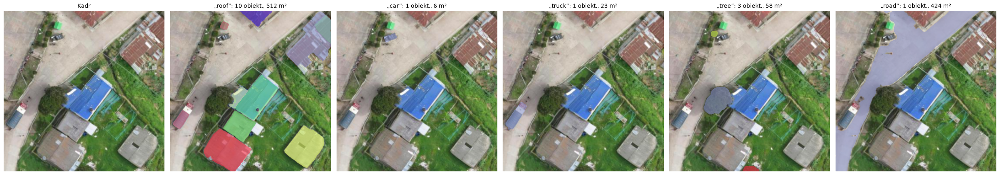

In [6]:
PROG = 0.5    # minimalna pewność obiektu


def koduj_obraz(obraz):
    """Ciężki krok: RGB uint8 (H,W,3) → cechy obrazu (do wielokrotnego użycia) i rozmiar oryginału [[H, W]]."""
    wejscie = procesor(images=obraz, return_tensors="pt")
    with torch.no_grad():
        cechy = model.get_vision_features(pixel_values=wejscie["pixel_values"].to(URZADZENIE))
    return cechy, wejscie["original_sizes"].tolist()


def znajdz_pojecie(cechy, rozmiar, pojecie, prog=PROG, wiersz0=0, kolumna0=0, ramki=(), etykiety_ramek=()):
    """Lekki krok: fraza -> obiekty. `ramki` = [(x1, y1, x2, y2), ...] w pikselach obrazu podanego do `koduj_obraz`,
    `etykiety_ramek`: 1 = „takie też chcę”, 0 = „takich nie chcę”. (wiersz0, kolumna0) = położenie obrazu w całym zdjęciu."""
    if len(ramki):
        wejscie = procesor(text=pojecie, input_boxes=[[[float(v) for v in r] for r in ramki]],
                           input_boxes_labels=[[int(e) for e in etykiety_ramek]], original_sizes=rozmiar, return_tensors="pt")
    else:
        wejscie = procesor(text=pojecie, return_tensors="pt")
    argumenty = {k: v.to(URZADZENIE) for k, v in wejscie.items()
                 if k in ("input_ids", "attention_mask", "input_boxes", "input_boxes_labels")}
    with torch.no_grad():
        wyjscie = model(vision_embeds=cechy, **argumenty)
    wynik = procesor.post_process_instance_segmentation(wyjscie, threshold=prog, mask_threshold=0.5, target_sizes=rozmiar)[0]

    obiekty = []
    for maska, pewnosc in zip(wynik["masks"].cpu().numpy().astype(bool), wynik["scores"].cpu().numpy()):
        wiersze, kolumny = np.flatnonzero(maska.any(1)), np.flatnonzero(maska.any(0))
        if len(wiersze) == 0:
            continue
        w1, w2, k1, k2 = wiersze[0], wiersze[-1] + 1, kolumny[0], kolumny[-1] + 1
        obiekty.append({"maska": maska[w1:w2, k1:k2].copy(), "wiersz": wiersz0 + int(w1), "kolumna": kolumna0 + int(k1),
                        "piksele": int(maska.sum()), "wynik": float(pewnosc), "pojecie": pojecie})
    return obiekty


def segmentuj_tekstem(obraz, pojecia, prog=PROG, wiersz0=0, kolumna0=0):
    """Koder obrazu raz, potem każda fraza osobno. Zwraca {fraza: lista obiektów}."""
    cechy, rozmiar = koduj_obraz(obraz)
    return {p: znajdz_pojecie(cechy, rozmiar, p, prog, wiersz0, kolumna0) for p in pojecia}


def pokaz_pojecia(obraz, wyniki, tytul_obrazu="Kadr"):
    """Kadr i po jednym panelu na frazę: obiekty w różnych kolorach + liczba i powierzchnia (bez podwójnego liczenia nakładek)."""
    fig, ax = plt.subplots(1, len(wyniki) + 1, figsize=(4.6 * (len(wyniki) + 1), 4.8))
    ax[0].imshow(obraz); ax[0].set_title(tytul_obrazu)
    for a, (fraza, obiekty) in zip(ax[1:], wyniki.items()):
        pow_m2 = maska_z_obiektow(obiekty, obraz.shape[:2]).sum() * gsd ** 2
        a.imshow(koloruj_obiekty(obraz, obiekty))
        a.set_title(f"„{fraza}”: {len(obiekty)} obiekt., {pow_m2:.0f} m²")
    for a in ax:
        a.axis("off")
    plt.tight_layout()


POJECIA_PRZYKLAD = ["roof", "car", "truck", "tree", "road"]

t0 = time.perf_counter()
wyniki_kadru = segmentuj_tekstem(kadr, POJECIA_PRZYKLAD)
print(f"{len(POJECIA_PRZYKLAD)} fraz na kadrze 400 x 400 px: {time.perf_counter() - t0:.1f} s")
pokaz_pojecia(kadr, wyniki_kadru)

,obiektów,powierzchnia [m²],najwyższa pewność
roof,10.0,512.09,0.94
metal roof,8.0,493.59,0.77
rusty roof,6.0,378.86,0.87
rooftop,5.0,362.52,0.62
building,6.0,560.00,0.92
house,6.0,561.77,0.94


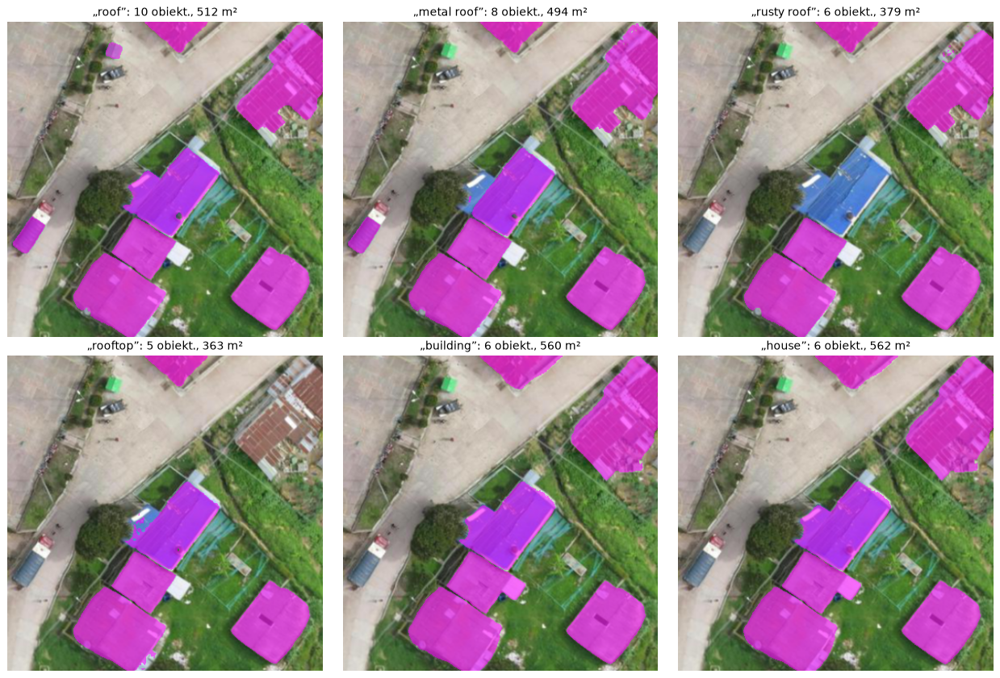

In [7]:
WARIANTY_FRAZ = ["roof", "metal roof", "rusty roof", "rooftop", "building", "house"]

cechy_kadru, rozmiar_kadru = koduj_obraz(kadr)
warianty = {f: znajdz_pojecie(cechy_kadru, rozmiar_kadru, f) for f in WARIANTY_FRAZ}

fig, ax = plt.subplots(2, 3, figsize=(14, 9.4))
for a, (fraza, obiekty) in zip(ax.ravel(), warianty.items()):
    suma = maska_z_obiektow(obiekty, kadr.shape[:2])
    a.imshow(nakladka(kadr, suma)); a.set_title(f"„{fraza}”: {len(obiekty)} obiekt., {suma.sum() * gsd ** 2:.0f} m²"); a.axis("off")
plt.tight_layout()

pd.DataFrame({f: {"obiektów": len(o), "powierzchnia [m²]": maska_z_obiektow(o, kadr.shape[:2]).sum() * gsd ** 2,
                  "najwyższa pewność": max((x["wynik"] for x in o), default=np.nan)} for f, o in warianty.items()}).T.round(2)

,0.15,0.30,0.50,0.70,0.80,0.90
obiektów,28.0,18.0,10.0,6.0,5.0,2.0
powierzchnia [m²],552.0,536.0,512.0,478.0,354.0,194.0


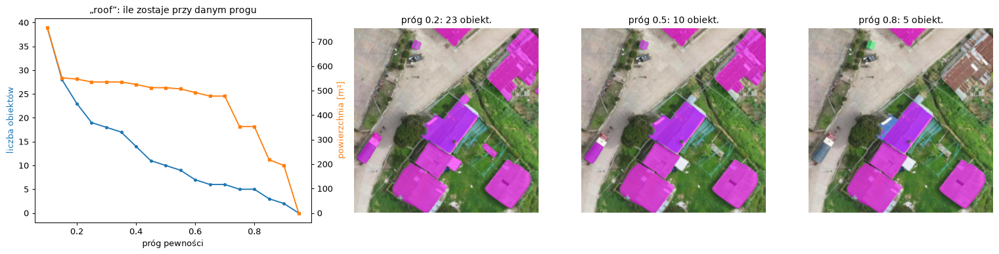

In [8]:
luzne = znajdz_pojecie(cechy_kadru, rozmiar_kadru, "roof", prog=0.05)
progi = np.round(np.arange(0.1, 0.96, 0.05), 2)
liczba = [sum(o["wynik"] >= p for o in luzne) for p in progi]
pow_prog = [maska_z_obiektow([o for o in luzne if o["wynik"] >= p], kadr.shape[:2]).sum() * gsd ** 2 for p in progi]

fig, ax = plt.subplots(1, 4, figsize=(17, 4.4), gridspec_kw={"width_ratios": [1.5, 1, 1, 1]})
ax[0].plot(progi, liczba, "o-", ms=3, color="C0"); ax[0].set_xlabel("próg pewności"); ax[0].set_ylabel("liczba obiektów", color="C0")
tw = ax[0].twinx(); tw.plot(progi, pow_prog, "s-", ms=3, color="C1"); tw.set_ylabel("powierzchnia [m²]", color="C1")
ax[0].set_title("„roof”: ile zostaje przy danym progu")
for a, p in zip(ax[1:], (0.2, 0.5, 0.8)):
    zostaje = [o for o in luzne if o["wynik"] >= p]
    a.imshow(nakladka(kadr, maska_z_obiektow(zostaje, kadr.shape[:2]))); a.set_title(f"próg {p}: {len(zostaje)} obiekt."); a.axis("off")
plt.tight_layout()

WYBRANE_PROGI = [0.15, 0.3, 0.5, 0.7, 0.8, 0.9]
pd.DataFrame({"obiektów": liczba, "powierzchnia [m²]": np.round(pow_prog)}, index=progi)[np.isin(progi, WYBRANE_PROGI)].T

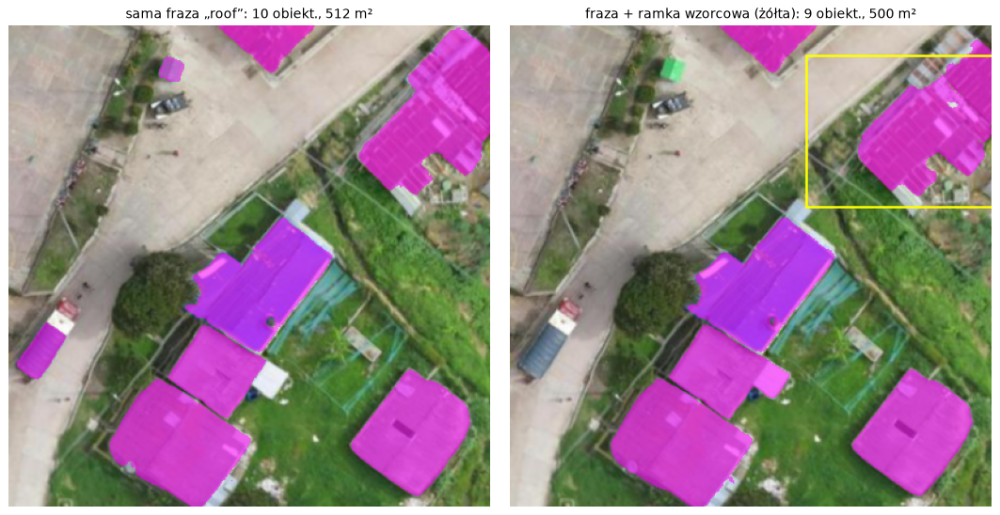

In [9]:
RAMKA_WZORCOWA = (245, 25, 400, 150)     # duży rdzawy dach w prawym górnym rogu kadru

bez_ramki = znajdz_pojecie(cechy_kadru, rozmiar_kadru, "roof")
z_ramka = znajdz_pojecie(cechy_kadru, rozmiar_kadru, "roof", ramki=[RAMKA_WZORCOWA], etykiety_ramek=[1])

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
for a, (opis, obiekty) in zip(ax, [("sama fraza „roof”", bez_ramki), ("fraza + ramka wzorcowa (żółta)", z_ramka)]):
    suma = maska_z_obiektow(obiekty, kadr.shape[:2])
    a.imshow(nakladka(kadr, suma))
    x1, y1, x2, y2 = RAMKA_WZORCOWA
    if "ramka" in opis:
        a.add_patch(plt.Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, ec="yellow", lw=2))
    a.set_title(f"{opis}: {len(obiekty)} obiekt., {suma.sum() * gsd ** 2:.0f} m²"); a.axis("off")
plt.tight_layout()

Kafel 60 m = 500 px; siatka masek 288 x 288 → jedno „oczko” ≈ 21 cm (przy kaflu 120 m: 42 cm)
Kafelki: 34 s


,obiektów,powierzchnia [m²],mediana pewności
roof,89.0,4520.98,0.74
car,2.0,11.78,0.73
truck,3.0,39.97,0.78
tree,112.0,2945.17,0.63
road,1.0,42.97,0.64


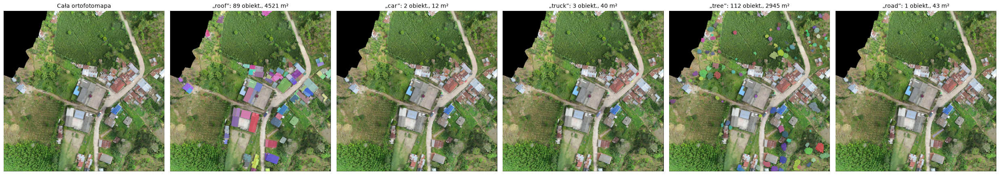

In [10]:
KAFEL_M, ZAKLADKA_M = 60, 15


def poczatki_kafli(n, kafel, zakladka):
    """Początki kafli o boku `kafel` px, równomiernie pokrywających `n` px, z zakładką nie mniejszą niż `zakladka`."""
    if n <= kafel:
        return [0]
    liczba = int(np.ceil((n - zakladka) / (kafel - zakladka)))
    return np.linspace(0, n - kafel, liczba).round().astype(int).tolist()


def iou_obiektow(a, b):
    """IoU dwóch obiektów zapisanych jako przycięte maski z położeniem (bez budowania pełnowymiarowych masek)."""
    w0, k0 = max(a["wiersz"], b["wiersz"]), max(a["kolumna"], b["kolumna"])
    w1 = min(a["wiersz"] + a["maska"].shape[0], b["wiersz"] + b["maska"].shape[0])
    k1 = min(a["kolumna"] + a["maska"].shape[1], b["kolumna"] + b["maska"].shape[1])
    if w1 <= w0 or k1 <= k0:
        return 0.0
    ma = a["maska"][w0 - a["wiersz"]:w1 - a["wiersz"], k0 - a["kolumna"]:k1 - a["kolumna"]]
    mb = b["maska"][w0 - b["wiersz"]:w1 - b["wiersz"], k0 - b["kolumna"]:k1 - b["kolumna"]]
    wspolna = (ma & mb).sum()
    return wspolna / (a["piksele"] + b["piksele"] - wspolna)


def czesc_wazna(obiekt, waznie):
    """Jaka część pikseli obiektu leży na ważnych danych (a nie na czarnym tle ortomozaiku)."""
    wys, szer = obiekt["maska"].shape
    return waznie[obiekt["wiersz"]:obiekt["wiersz"] + wys, obiekt["kolumna"]:obiekt["kolumna"] + szer][obiekt["maska"]].mean()


def maski_tekstem_kafelkami(rgb, waznie, pojecia, gsd, kafel_m=KAFEL_M, zakladka_m=ZAKLADKA_M, prog=PROG, min_obiekt_m2=1.0):
    """SAM 3 na kafelkach z zakładką, dla każdej frazy. Zwraca {fraza: obiekty w układzie całego zdjęcia}."""
    wys_zdj, szer_zdj = waznie.shape
    kafel, zakladka = round(kafel_m / gsd), round(zakladka_m / gsd)
    kandydaci = {p: [] for p in pojecia}
    for w0 in poczatki_kafli(wys_zdj, kafel, zakladka):
        for k0 in poczatki_kafli(szer_zdj, kafel, zakladka):
            okno = np.s_[w0:w0 + kafel, k0:k0 + kafel]
            if waznie[okno].mean() < 0.05:                       # kafel prawie bez danych
                continue
            wys, szer = waznie[okno].shape
            cechy, rozmiar = koduj_obraz(rgb[okno].copy())       # koder obrazu raz na kafel, potem fraza po frazie
            for p in pojecia:
                for o in znajdz_pojecie(cechy, rozmiar, p, prog, w0, k0):
                    h, w = o["maska"].shape
                    y, x = o["wiersz"] - w0, o["kolumna"] - k0        # położenie maski w kaflu
                    ucieta = ((x == 0 and k0 > 0) or (y == 0 and w0 > 0)                       # dotyka wewnętrznej krawędzi kafla
                              or (x + w == szer and k0 + szer < szer_zdj) or (y + h == wys and w0 + wys < wys_zdj))
                    if not ucieta and czesc_wazna(o, waznie) >= 0.5 and o["piksele"] * gsd ** 2 >= min_obiekt_m2:
                        kandydaci[p].append(o)

    wynik = {}
    for p, lista in kandydaci.items():
        lista.sort(key=lambda o: -o["wynik"])                    # najpewniejsze pierwsze
        zostawione = []
        for o in lista:
            if all(iou_obiektow(o, z) < 0.7 for z in zostawione):    # duplikat z zakładki?
                zostawione.append(o)
        wynik[p] = zostawione
    return wynik


print(f"Kafel {KAFEL_M} m = {round(KAFEL_M / gsd)} px; siatka masek 288 x 288 → jedno „oczko” ≈ "
      f"{KAFEL_M / 288 * 100:.0f} cm (przy kaflu 120 m: {120 / 288 * 100:.0f} cm)")

t0 = time.perf_counter()
obiekty_cale = maski_tekstem_kafelkami(rgb, waznie, POJECIA_PRZYKLAD, gsd)
czas_kafle = time.perf_counter() - t0
print(f"Kafelki: {czas_kafle:.0f} s")

pokaz_pojecia(rgb, obiekty_cale, "Cała ortofotomapa")
pd.DataFrame({f: {"obiektów": len(o), "powierzchnia [m²]": maska_z_obiektow(o, rgb.shape[:2]).sum() * gsd ** 2,
                  "mediana pewności": np.median([x["wynik"] for x in o]) if o else np.nan} for f, o in obiekty_cale.items()}).T.round(2)

Oznaczone: 18.9% pikseli ważnych, NIEZNANE: 81.1%; sporne (kilka klas): 1849 px = 0.07%


,piksele,powierzchnia [ha],udział [%]
inne,0,0.00,0.00
ściana,0,0.00,0.00
droga,2984,0.00,0.11
roślinność,204491,0.29,7.39
pojazd,3258,0.00,0.12
dach,312049,0.45,11.27
woda,0,0.00,0.00


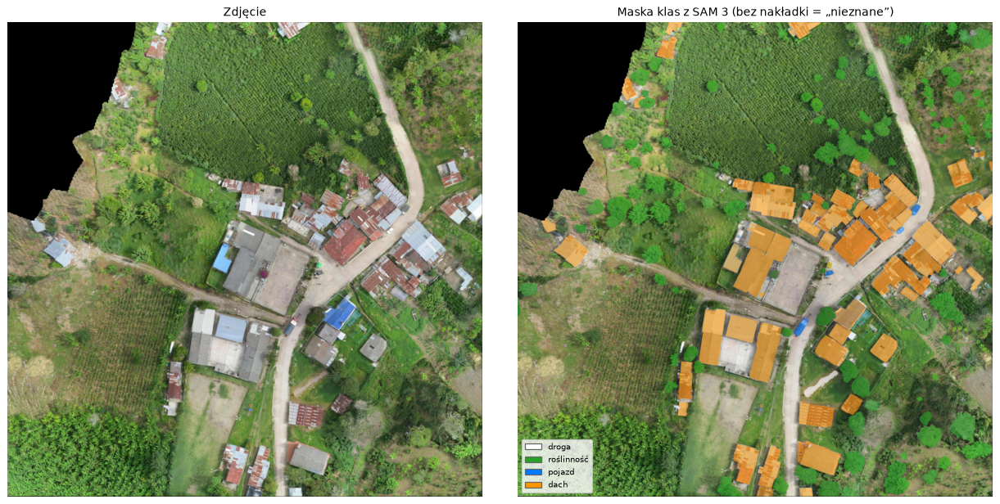

In [11]:
# fraza (po angielsku, do SAM 3) -> klasa z poziomu 3. Frazy bez klasy nie trafią do maski.
POJECIE_NA_KLASE = {
    "roof": "dach",
    "car": "pojazd",
    "truck": "pojazd",
    "tree": "roślinność",
    "road": "droga",
}
KOLEJNOSC = ["roślinność", "droga", "dach", "pojazd"]      # od spodu do wierzchu; musi zawierać każdą klasę ze słownika
assert set(POJECIE_NA_KLASE.values()) <= set(KOLEJNOSC), "klasa bez miejsca w KOLEJNOSC"


def maska_klas(obiekty, ksztalt, waznie, pojecie_na_klase=POJECIE_NA_KLASE, kolejnosc=KOLEJNOSC):
    """{fraza: obiekty} -> maska klas (uint8; NIEZNANE tam, gdzie nic nie wskazano). Zwraca też liczbę pikseli spornych
    (zgłoszonych przez więcej niż jedną klasę)."""
    klasy = np.full(ksztalt, NIEZNANE, dtype=np.uint8)
    zgloszenia = np.zeros(ksztalt, dtype=np.uint8)
    for nazwa in kolejnosc:
        pokrycie = np.zeros(ksztalt, dtype=bool)
        for fraza, klasa in pojecie_na_klase.items():
            if klasa == nazwa:
                pokrycie |= maska_z_obiektow(obiekty.get(fraza, []), ksztalt)
        klasy[pokrycie] = NAZWY_KLAS.index(nazwa)
        zgloszenia += pokrycie
    klasy[~waznie] = NIEZNANE
    return klasy, int((zgloszenia[waznie] > 1).sum())


def podglad_klas(rgb, klasy, alfa=0.55):
    """Zdjęcie z maską klas; piksele „nieznane” zostają nietknięte."""
    wynik = rgb.astype(np.float32)
    znane = klasy != NIEZNANE
    wynik[znane] = (1 - alfa) * wynik[znane] + alfa * KOLORY_RGB[klasy[znane]]
    return wynik.astype(np.uint8)


def legenda(klasy_uzyte):
    return [Patch(facecolor=KOLORY_KLAS[i], edgecolor="0.4", label=NAZWY_KLAS[i]) for i in sorted(klasy_uzyte)]


klasy_sam3, sporne = maska_klas(obiekty_cale, waznie.shape, waznie)
liczniki = np.bincount(klasy_sam3[klasy_sam3 != NIEZNANE], minlength=N_KLAS)
n_waznych = int(waznie.sum())

fig, ax = plt.subplots(1, 2, figsize=(14, 6.8))
ax[0].imshow(rgb); ax[0].set_title("Zdjęcie")
ax[1].imshow(podglad_klas(rgb, klasy_sam3)); ax[1].set_title("Maska klas z SAM 3 (bez nakładki = „nieznane”)")
ax[1].legend(handles=legenda(np.flatnonzero(liczniki)), loc="lower left", fontsize=8)
for a in ax:
    a.axis("off")
plt.tight_layout()

print(f"Oznaczone: {liczniki.sum() / n_waznych:.1%} pikseli ważnych, NIEZNANE: {1 - liczniki.sum() / n_waznych:.1%}; "
      f"sporne (kilka klas): {sporne} px = {sporne / n_waznych:.2%}")
pd.DataFrame({"piksele": liczniki, "powierzchnia [ha]": liczniki * gsd ** 2 / 1e4, "udział [%]": liczniki / n_waznych * 100},
             index=NAZWY_KLAS).round(2)

In [13]:
def zapisz_maske_klas(klasy, profil, sciezka):
    """Maska klas (uint8, 255 = nieznane) jako GeoTIFF na siatce zdjęcia, z paletą kolorów poziomu 3."""
    with rasterio.open(sciezka, "w", driver="GTiff", height=klasy.shape[0], width=klasy.shape[1], count=1, dtype="uint8",
                       crs=profil["crs"], transform=profil["transform"], nodata=NIEZNANE, compress="deflate") as dst:
        dst.write(klasy, 1)
        dst.write_colormap(1, {i: (*map(int, kolor), 255) for i, kolor in enumerate(KOLORY_RGB)})


def maska_do_poligonu(maska, transform, gsd):
    """Maska (bool) -> jeden poligon (lub multipoligon) w układzie mapy, uproszczony o 1 piksel.
    `transform` musi opisywać położenie samej tablicy `maska` (nie całego zdjęcia)."""
    czesci = [shape(g) for g, _ in shapes(maska.astype(np.uint8), mask=maska, transform=transform)]
    return unary_union(czesci).simplify(gsd)


KOLUMNY_GDF = ["id", "pojecie", "klasa", "wynik", "pow_m2", "geometry"]


def obiekty_do_gdf(obiekty, profil, gsd, pojecie_na_klase=POJECIE_NA_KLASE):
    """{fraza: obiekty} -> GeoDataFrame: poligon w układzie zdjęcia + fraza, klasa, pewność, powierzchnia."""
    wiersze = []
    for fraza, lista in obiekty.items():
        for o in lista:
            wiersze.append({
                "id": len(wiersze) + 1, "pojecie": fraza, "klasa": pojecie_na_klase[fraza], "wynik": round(o["wynik"], 2),
                "pow_m2": round(o["piksele"] * gsd ** 2, 1),
                "geometry": maska_do_poligonu(o["maska"], profil["transform"] * Affine.translation(o["kolumna"], o["wiersz"]), gsd)})
    return gpd.GeoDataFrame(pd.DataFrame(wiersze, columns=KOLUMNY_GDF), geometry="geometry", crs=profil["crs"])


def rasteryzuj_gdf(gdf, ksztalt, transform, waznie, kolejnosc=KOLEJNOSC):
    """Poligony z kolumną `klasa` -> maska klas (ta sama kolejność malowania: od spodu do wierzchu)."""
    klasy = np.full(ksztalt, NIEZNANE, dtype=np.uint8)
    kolejnosc_klas = {nazwa: i for i, nazwa in enumerate(kolejnosc)}
    gdf = gdf.assign(_k=gdf["klasa"].map(kolejnosc_klas)).sort_values("_k")
    ksztalty = [(g, NAZWY_KLAS.index(k)) for g, k in zip(gdf.geometry, gdf["klasa"])]
    if ksztalty:
        rasterize(ksztalty, out=klasy, transform=transform)
    klasy[~waznie] = NIEZNANE
    return klasy


zapisz_maske_klas(klasy_sam3, profil, KATALOG_WYNIKOW / "tapias_sam3_klasy.tif")
gdf_sam3 = obiekty_do_gdf(obiekty_cale, profil, gsd)
sciezka_gpkg = KATALOG_WYNIKOW / "tapias_sam3_obiekty.gpkg"
sciezka_gpkg.unlink(missing_ok=True)
gdf_sam3.to_file(sciezka_gpkg, layer="obiekty", driver="GPKG")
plt.imsave(KATALOG_WYNIKOW / "tapias_sam3_podglad.png", podglad_klas(rgb, klasy_sam3))

# Kontrola: maska -> poligony -> maska. Bez ręcznych poprawek powinna zgadzać się w prawie wszystkich pikselach.
klasy_z_gpkg = rasteryzuj_gdf(gdf_sam3, waznie.shape, profil["transform"], waznie)
znane = (klasy_sam3 != NIEZNANE) | (klasy_z_gpkg != NIEZNANE)
print(f"{len(gdf_sam3)} obiektów → {sciezka_gpkg.name}; po drodze maska→poligony→maska zgodność na oznaczonych pikselach: "
      f"{(klasy_sam3 == klasy_z_gpkg)[znane].mean():.2%}")
gdf_sam3.drop(columns="geometry").groupby("klasa").agg(obiektow=("id", "size"), pow_m2=("pow_m2", "sum"), mediana_pewnosci=("wynik", "median")).round(2)

207 obiektów → tapias_sam3_obiekty.gpkg; po drodze maska→poligony→maska zgodność na oznaczonych pikselach: 98.65%


,obiektow,pow_m2,mediana_pewnosci
klasa,,,
dach,89,5822.5,0.74
droga,1,43.0,0.64
pojazd,5,51.8,0.78
roślinność,112,3009.1,0.63


Dach: SAM 3 0.45 ha, U-Net 0.04 ha


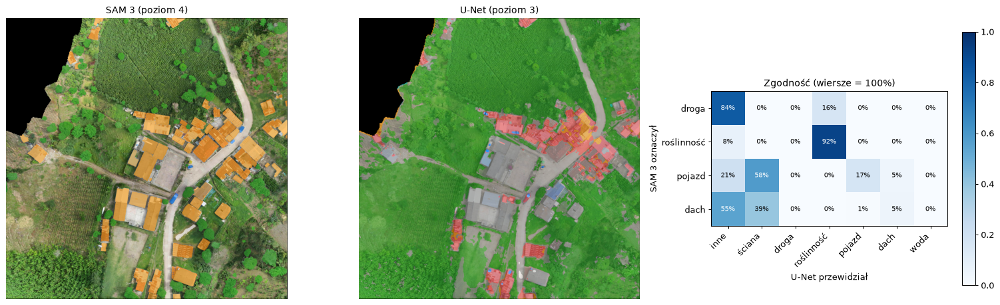

In [14]:
PLIK_UNET = Path("wyniki/tapias_klasy.tif")       # wynik notebooka 03

if PLIK_UNET.exists():
    with rasterio.open(PLIK_UNET) as src:
        unet = src.read(1)
    wspolne = (klasy_sam3 != NIEZNANE) & (unet != 255)
    idx = N_KLAS * klasy_sam3[wspolne].astype(np.int64) + unet[wspolne].astype(np.int64)
    cm = np.bincount(idx, minlength=N_KLAS ** 2).reshape(N_KLAS, N_KLAS)      # wiersz = klasa z SAM 3, kolumna = klasa z U-Net
    wiersze = [i for i in range(N_KLAS) if cm[i].sum() > 0]
    cm_norm = cm[wiersze] / cm[wiersze].sum(1, keepdims=True)

    fig, ax = plt.subplots(1, 3, figsize=(17, 5.6), gridspec_kw={"width_ratios": [1, 1, 1.05]})
    ax[0].imshow(podglad_klas(rgb, klasy_sam3)); ax[0].set_title("SAM 3 (poziom 4)")
    ax[1].imshow(podglad_klas(rgb, unet)); ax[1].set_title("U-Net (poziom 3)")
    ax[0].axis("off"); ax[1].axis("off")
    obraz = ax[2].imshow(cm_norm, cmap="Blues", vmin=0, vmax=1)
    ax[2].set_xticks(range(N_KLAS), NAZWY_KLAS, rotation=45, ha="right"); ax[2].set_yticks(range(len(wiersze)), [NAZWY_KLAS[i] for i in wiersze])
    for i in range(len(wiersze)):
        for j in range(N_KLAS):
            ax[2].text(j, i, f"{cm_norm[i, j]:.0%}", ha="center", va="center", fontsize=8, color="white" if cm_norm[i, j] > 0.5 else "black")
    ax[2].set_xlabel("U-Net przewidział"); ax[2].set_ylabel("SAM 3 oznaczył")
    ax[2].set_title("Zgodność (wiersze = 100%)"); plt.colorbar(obraz, ax=ax[2], shrink=0.8)
    plt.tight_layout()
    print(f"Dach: SAM 3 {(klasy_sam3 == NAZWY_KLAS.index('dach')).sum() * gsd ** 2 / 1e4:.2f} ha, "
          f"U-Net {(unet == NAZWY_KLAS.index('dach')).sum() * gsd ** 2 / 1e4:.2f} ha")
else:
    print(f"Brak {PLIK_UNET} — najpierw uruchom notebook 03 (poziom 3).")